Number of nodes: 2662
Number of edges: 6948
Number of nodes: 8540
Number of edges: 16921


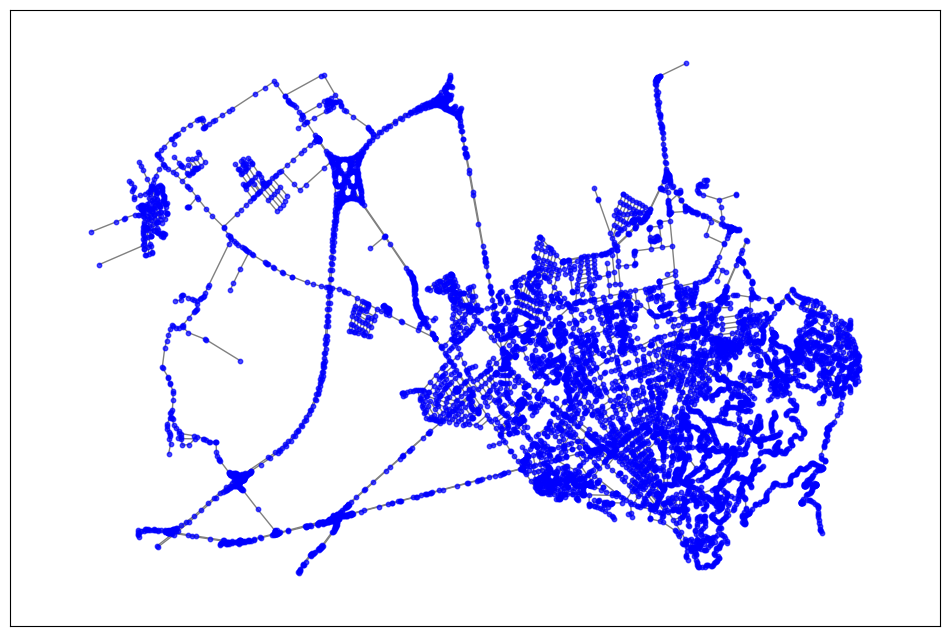

In [4]:
import xml.etree.ElementTree as ET
import pandas as pd
from typing import Dict, List, Tuple
import logging
import re


import osmnx as ox
import matplotlib.pyplot as plt
import networkx as nx


city_name = "Blida, Algeria"
output_file = "Blida_map.graphml"


# Download the map data
G = ox.graph_from_place(city_name, network_type='drive',simplify=False)
ox.save_graphml(G, filepath=output_file)


# print numer of nodes and edges
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

# Convert the MultiDiGraph to an undirected Graph for simpler plotting (optional)
# This avoids plotting both directions of each edge
plt.figure(figsize=(12, 8))
G_simple = nx.Graph(G)  # This merges multi-edges and ignores direction
pos = {node: (data['x'], data['y']) for node, data in G_simple.nodes(data=True)}
nx.draw_networkx_edges(G_simple, pos, edge_color='gray', width=1)
nx.draw_networkx_nodes(G_simple, pos, node_size=10, node_color='blue', alpha=0.7)







In [16]:
import folium


center_lat, center_lon = 36.4731, 2.8289  # Blida coordinates

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=15,
    tiles='cartodbpositron'
)


for node, data in G.nodes(data=True):
    folium.CircleMarker(
        location=(data['y'], data['x']),
        radius=0.05,
        color='blue',
        fill=False,

    ).add_to(m)

m

In [ ]:
import sys
from pathlib import Path


from simulation.bus_lines_manager import BusLinesManager, Station, BusLine
from simulation.graph_loader import GraphLoader
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import folium

# Init 

show_nodes = True

graph_loader = GraphLoader('data/Blida_map.graphml')


center_lat, center_lon = graph_loader.get_map_center()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=15,
    tiles='cartodbpositron'
)


if show_nodes:        
    for node, data in graph_loader.nodes.items():
        print(node, data)
        folium.CircleMarker(
            location=(data['lat'], data['lon']),  # Changed from data['y'], data['x']
            radius=0.05,
            color='blue',
            fill=False,
        ).add_to(m)

m

288408503 {'lat': 36.4657658, 'lon': 2.7622482, 'data': {'y': '36.4657658', 'x': '2.7622482', 'street_count': '2'}}
288408504 {'lat': 36.4682871, 'lon': 2.7661919, 'data': {'y': '36.4682871', 'x': '2.7661919', 'street_count': '2'}}
288408505 {'lat': 36.4694998, 'lon': 2.7682863, 'data': {'y': '36.4694998', 'x': '2.7682863', 'street_count': '2'}}
288408508 {'lat': 36.4736737, 'lon': 2.7765383, 'data': {'y': '36.4736737', 'x': '2.7765383', 'street_count': '2'}}
288408509 {'lat': 36.4746885, 'lon': 2.7778673, 'data': {'y': '36.4746885', 'x': '2.7778673', 'street_count': '2'}}
288408511 {'lat': 36.4769635, 'lon': 2.780004, 'data': {'y': '36.4769635', 'x': '2.780004', 'street_count': '2'}}
288408517 {'lat': 36.4871582, 'lon': 2.7828133, 'data': {'y': '36.4871582', 'x': '2.7828133', 'street_count': '2'}}
288408522 {'lat': 36.4993354, 'lon': 2.784467, 'data': {'y': '36.4993354', 'x': '2.784467', 'street_count': '2'}}
288408523 {'lat': 36.5009043, 'lon': 2.7852209, 'data': {'y': '36.5009043', 

: 

In [2]:
import osmnx as ox
G = ox.load_graphml('data/Blida_map.graphml')

G

## Graphloader